In [2]:
import os
import numpy as np
import pandas as pd
import librosa
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)

from sklearn.svm import SVC
from sklearn.ensemble import (
    RandomForestClassifier, ExtraTreesClassifier,
    GradientBoostingClassifier, AdaBoostClassifier
)
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# =========================
# CONFIG
# =========================
DATASET_ROOT = "/home/feliciano/Downloads/Preliminary Data/AllFish_2secSplit"
SR = 22050
N_MFCC = 20
N_MELS = 64
RANDOM_STATE = 42

# =========================
# FEATURE EXTRACTION
# =========================
def extract_features(wav_path):
    y, sr = librosa.load(wav_path, sr=SR)

    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=N_MFCC)
    mel = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=N_MELS)
    zcr = librosa.feature.zero_crossing_rate(y)
    centroid = librosa.feature.spectral_centroid(y=y, sr=sr)
    bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
    rms = librosa.feature.rms(y=y)

    return np.hstack([
        mfcc.mean(axis=1), mfcc.std(axis=1),
        mel.mean(axis=1), mel.std(axis=1),
        zcr.mean(), zcr.std(),
        centroid.mean(), centroid.std(),
        bandwidth.mean(), bandwidth.std(),
        rms.mean(), rms.std()
    ])

# =========================
# LOAD DATA
# =========================
X, y = [], []

print("Extracting features...")

for label in sorted(os.listdir(DATASET_ROOT)):
    class_dir = os.path.join(DATASET_ROOT, label)
    if not os.path.isdir(class_dir):
        continue

    for f in os.listdir(class_dir):
        if f.endswith(".wav"):
            X.append(extract_features(os.path.join(class_dir, f)))
            y.append(label)

X = np.array(X)
y = np.array(y)

le = LabelEncoder()
y = le.fit_transform(y)

# =========================
# SPLIT: 70 / 20 / 10
# =========================
X_train, X_tmp, y_train, y_tmp = train_test_split(
    X, y, test_size=0.30, stratify=y, random_state=RANDOM_STATE
)

X_test, X_val, y_test, y_val = train_test_split(
    X_tmp, y_tmp, test_size=1/3, stratify=y_tmp, random_state=RANDOM_STATE
)

# =========================
# MODELS
# =========================
models = {
    "SVM-RBF": SVC(kernel="rbf"),
    "RandomForest": RandomForestClassifier(n_estimators=300),
    "ExtraTrees": ExtraTreesClassifier(n_estimators=300),
    "GradientBoosting": GradientBoostingClassifier(),
    "KNN": KNeighborsClassifier(n_neighbors=7),
    "LogisticRegression": LogisticRegression(max_iter=500),
    "NaiveBayes": GaussianNB(),
    "DecisionTree": DecisionTreeClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "LDA": LinearDiscriminantAnalysis()
}

# =========================
# TRAIN & EVALUATE
# =========================
results = []

for name, model in models.items():
    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", model)
    ])

    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)

    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision_macro": precision_score(y_test, y_pred, average="macro"),
        "Recall_macro": recall_score(y_test, y_pred, average="macro"),
        "F1_macro": f1_score(y_test, y_pred, average="macro")
    })

df = pd.DataFrame(results).sort_values("Accuracy", ascending=False)
print("\n=== ML RESULTS (TEST SET) ===")
print(df)

print("\nClassification report (best model):")
best_model = df.iloc[0]["Model"]
print(best_model)


Extracting features...


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec


=== ML RESULTS (TEST SET) ===
                Model  Accuracy  Precision_macro  Recall_macro  F1_macro
1        RandomForest  1.000000         1.000000      1.000000  1.000000
2          ExtraTrees  1.000000         1.000000      1.000000  1.000000
7        DecisionTree  0.999974         0.999992      0.999783  0.999887
3    GradientBoosting  0.999974         0.999992      0.999930  0.999961
5  LogisticRegression  0.999923         0.999558      0.999896  0.999727
4                 KNN  0.999872         0.999302      0.999523  0.999412
9                 LDA  0.999846         0.999177      0.999115  0.999146
0             SVM-RBF  0.999538         0.999519      0.999156  0.999337
6          NaiveBayes  0.999410         0.997940      0.995571  0.996733
8            AdaBoost  0.976042         0.737670      0.799764  0.763008

Classification report (best model):
RandomForest


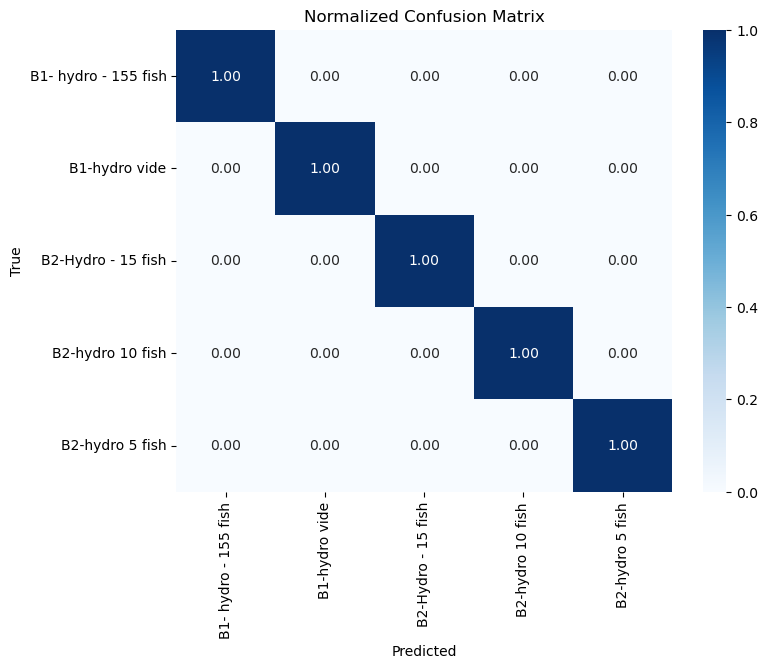

In [4]:
import os
import numpy as np
import librosa
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# CONFIG
# =========================
DATASET_ROOT = "/home/feliciano/Downloads/Preliminary Data/AllFish_2secSplit"
SR = 22050
DURATION = 2.0
TARGET_LEN = int(SR * DURATION)
N_MELS = 64

# =========================
# AUDIO FEATURES
# =========================
def extract_features(path):
    y, _ = librosa.load(path, sr=SR)
    if len(y) < TARGET_LEN:
        y = np.pad(y, (0, TARGET_LEN - len(y)))
    y = y[:TARGET_LEN]

    mel = librosa.feature.melspectrogram(y=y, sr=SR, n_mels=N_MELS)
    mel_db = librosa.power_to_db(mel, ref=np.max)
    return mel_db.flatten()

# =========================
# LOAD DATA
# =========================
X, y = [], []

for cls in sorted(os.listdir(DATASET_ROOT)):
    d = os.path.join(DATASET_ROOT, cls)
    if not os.path.isdir(d):
        continue
    for f in os.listdir(d):
        if f.endswith(".wav"):
            X.append(extract_features(os.path.join(d, f)))
            y.append(cls)

X = np.array(X)
y = np.array(y)

le = LabelEncoder()
y = le.fit_transform(y)

# =========================
# SPLIT 70 / 20 / 10
# =========================
X_train, X_tmp, y_train, y_tmp = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_tmp, y_tmp, test_size=1/3, stratify=y_tmp, random_state=42)

# =========================
# TRAIN MODEL
# =========================
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

model = RandomForestClassifier(n_estimators=200)
model.fit(X_train, y_train)

# =========================
# PREDICT
# =========================
y_pred = model.predict(X_test)
y_true = y_test

# =========================
# CONFUSION MATRIX
# =========================
cm = confusion_matrix(y_true, y_pred)
cm_norm = cm.astype("float") / cm.sum(axis=1, keepdims=True)

class_names = le.classes_

plt.figure(figsize=(8, 6))
sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Normalized Confusion Matrix")
plt.show()


In [1]:
import matplotlib.pyplot as plt

# =========================
# ACCURACY vs N_ESTIMATORS
# =========================

def plot_accuracy_vs_estimators(model_class, model_name):
    train_acc = []
    test_acc = []

    for n in range(1, 101):  # 1 to 100
        model = model_class(n_estimators=n, random_state=RANDOM_STATE)

        pipe = Pipeline([
            ("scaler", StandardScaler()),
            ("clf", model)
        ])

        pipe.fit(X_train, y_train)

        train_acc.append(pipe.score(X_train, y_train))
        test_acc.append(pipe.score(X_test, y_test))

    plt.figure()
    plt.plot(range(1, 101), train_acc)
    plt.plot(range(1, 101), test_acc)
    plt.xlabel("Number of Estimators")
    plt.ylabel("Accuracy")
    plt.title(f"{model_name} Accuracy vs Estimators")
    plt.show()


# Plot for applicable models
plot_accuracy_vs_estimators(RandomForestClassifier, "Random Forest")
plot_accuracy_vs_estimators(ExtraTreesClassifier, "Extra Trees")
plot_accuracy_vs_estimators(GradientBoostingClassifier, "Gradient Boosting")
plot_accuracy_vs_estimators(AdaBoostClassifier, "AdaBoost")


NameError: name 'RandomForestClassifier' is not defined

In [ ]:
# Print the counts to verify the 70/20/10 split
print(f"Total samples: {len(X)}")
print(f"---")
print(f"Training set:   {len(X_train)} samples ({len(X_train)/len(X):.1%})")
print(f"Testing set:    {len(X_test)} samples ({len(X_test)/len(X):.1%})")
print(f"Validation set: {len(X_val)} samples ({len(X_val)/len(X):.1%})")

# Verification of Stratification (checking one class as an example)
import numpy as np
unique, counts = np.unique(y_train, return_counts=True)
print(f"\nClass distribution in Training (first 3 classes): {counts[:3] / len(y_train)}")